# Table of Content
 1. Explore data for basic understanding
 2. Data Visualization
        2.1. Data distribution based on diagnosis
        2.2 Outliers visualization
        2.3 Feature correlation visualization
        2.4 Visualize correlation with Heatmap  
 3. Feature engeneering selection and test selection


In [1]:
#Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns#Understanding my variables

# 1. Explore data for basic understanding

In [2]:
#load data and view the first couple rows of data
data=pd.read_csv('../Data/data_cleaned.csv')
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
#understand the shape of data
data.shape

(569, 31)

In [4]:
#undestand the catogories of data
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [5]:
#check if diagnosis has null or nonsense value
data['diagnosis'].unique()

array([1, 0])

In [6]:
#undestand the basic information of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [7]:
#understand the basic statitic of data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.372583,0.483918,0.000000,0.000000,0.000000,1.000000,1.00000
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400


In [8]:
#The numeric correlation of features
data.corr()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.330499,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


# 2. Data Visualization

Some data visualizations are done previously from data wrangling stage
They were pasted here for reference and analysis

### 2.1. Data distribution based on diagnosis

Text(0, 0.5, 'Number of cases')

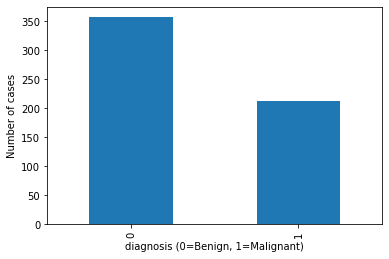

In [9]:
# Cases and diagnosis result visualization with bar plot
# 357 cases are diagnosised as Bnign(negative), and 212 are diagnosised as Malignant(positive)
data['diagnosis'].value_counts().plot(kind='bar')
plt.xlabel('diagnosis (0=Benign, 1=Malignant)')
plt.ylabel('Number of cases')

In [10]:
# diagnosis percentage distribution of malignant 
total_case=data.diagnosis.count()
positive_case = data[data['diagnosis'] == 1].diagnosis.count()
negative_case=data[data['diagnosis'] == 0].diagnosis.count()
positive_perc = (positive_case/total_case)*100
negative_perc = (negative_case/total_case)*100
print("There are " + str(total_case) + " cases." + " "+str(positive_case) + " cases are Malignant, and " + str(negative_case) + " cases are Benign.")
print(str(round(positive_perc))+ "% is malignant, " + str(round(negative_perc)) + "% is benign.")

There are 569 cases. 212 cases are Malignant, and 357 cases are Benign.
37% is malignant, 63% is benign.


<AxesSubplot:ylabel='diagnosis'>

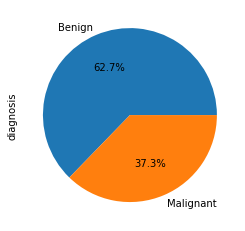

In [11]:
# Cases and diagnosis result visualization with pie plot
data['diagnosis'].value_counts().plot(kind='pie', autopct='%1.1f%%', labels=['Benign', 'Malignant'])

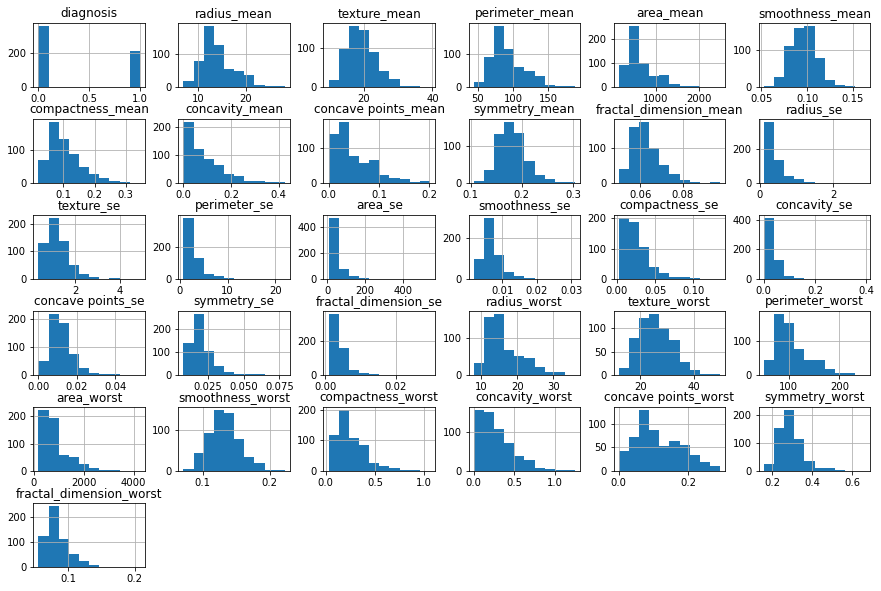

In [12]:
# Data distribution for each feature by histogram
data.hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5);

* Many features represent a possion distribution, such as "texture_se", "concave points_se", etc
* Some features represent a one sided distribution that skwed to the right, such as "perimeter_se", "symmetry_se", "concavity_se", etc.

### 2.2 Outliers visualization

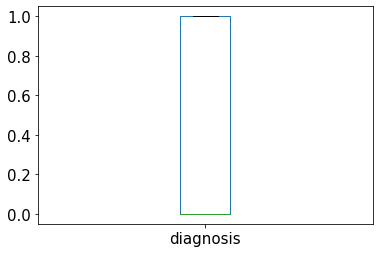

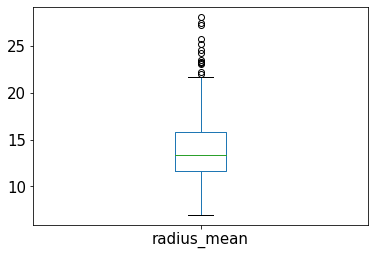

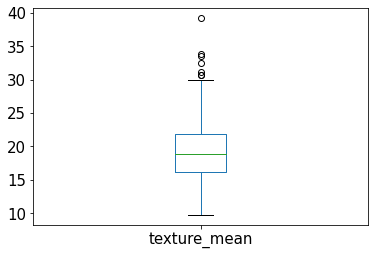

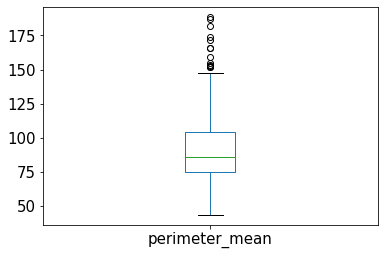

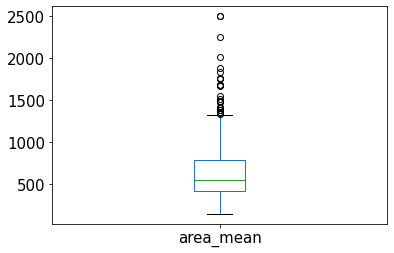

...

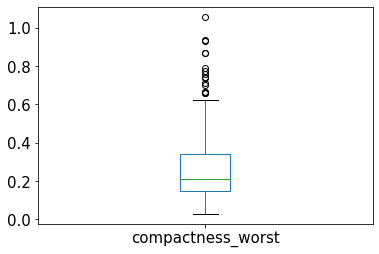

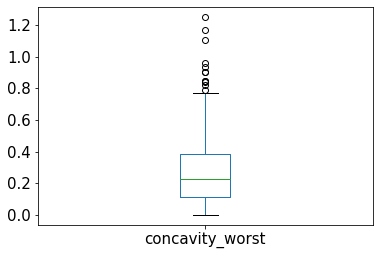

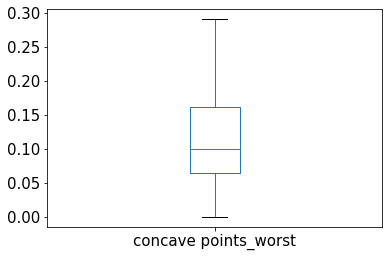

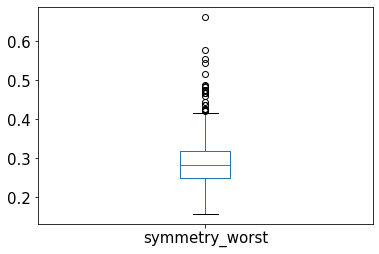

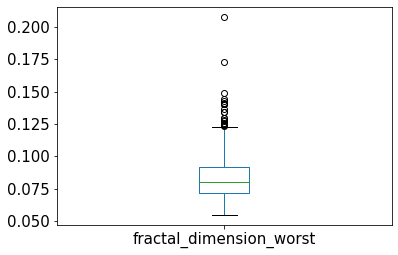

In [13]:
# Visualize outliers with box plot
name=data.columns
for column in name:
    data.boxplot(column =[column], grid=False, fontsize=15)
    plt.show()

* From boxplots, we can see that all features, except "diagnosis" and "concave point_worst", they all have outliers

### 2.3 Feature correlation visualization

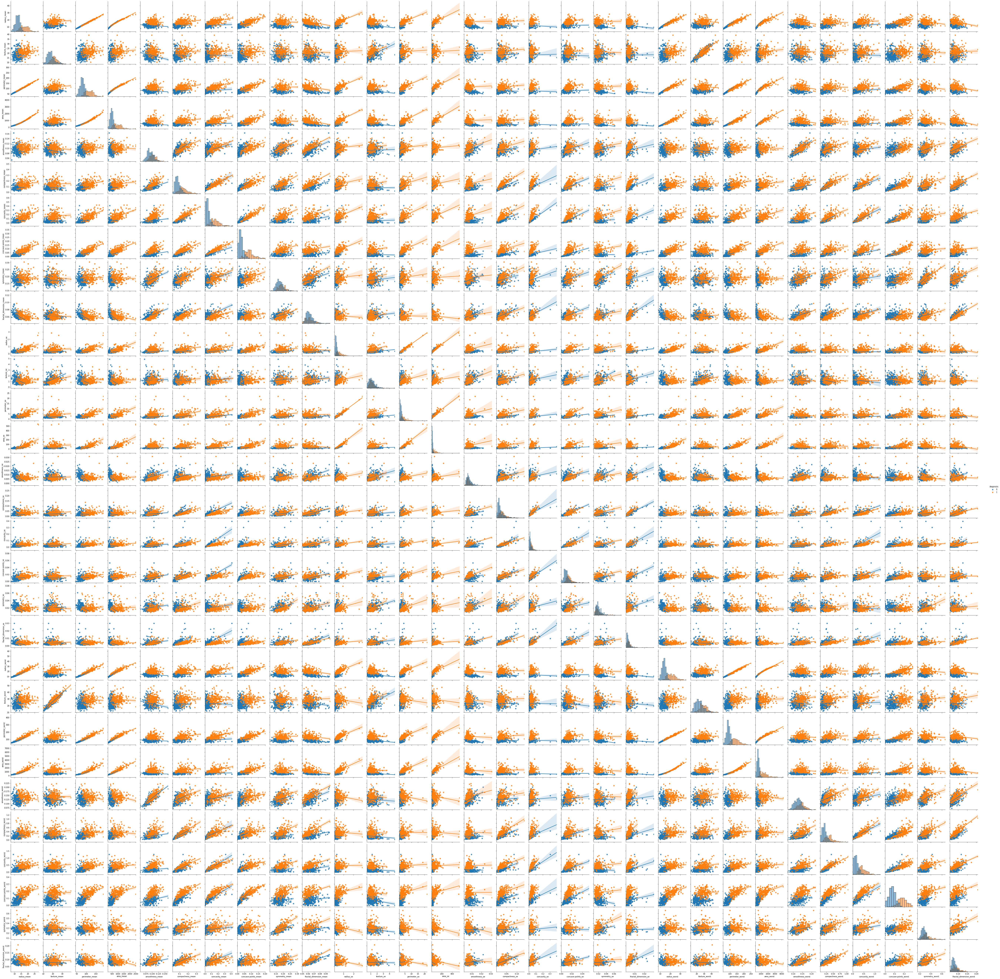

In [14]:
# use pariplot to visualize the correlation between features
sns.pairplot(data, hue='diagnosis',kind='reg',diag_kind='hist')

* The orage dots of data are cases of breast cancer, and blue dots of date are cases of not breast cancer. 
* There are some feartures represent linear correlation with each orher. Such as "perimeter_mean" and "radius_mean"
* the data distribution of some features like "smoothness_worst" are very broad, data of case 0 and 1 are mixed together. Therefore, features similar to this may not able to help with identifying and classify the diagnosis.
* In many features, there are outliners that may effect the data mean and average in a negative way. 
* Data from each features, except diagnosis, do not have a identical boarder to seperate/identify cases that are diagnosis as cancer. However, cases identified as cancer are attend to have higher values in most features.
* This image is saved under image folder of the project repositary for referece.




### 2.4 Visualize correlation with Heatmap  

<AxesSubplot:>

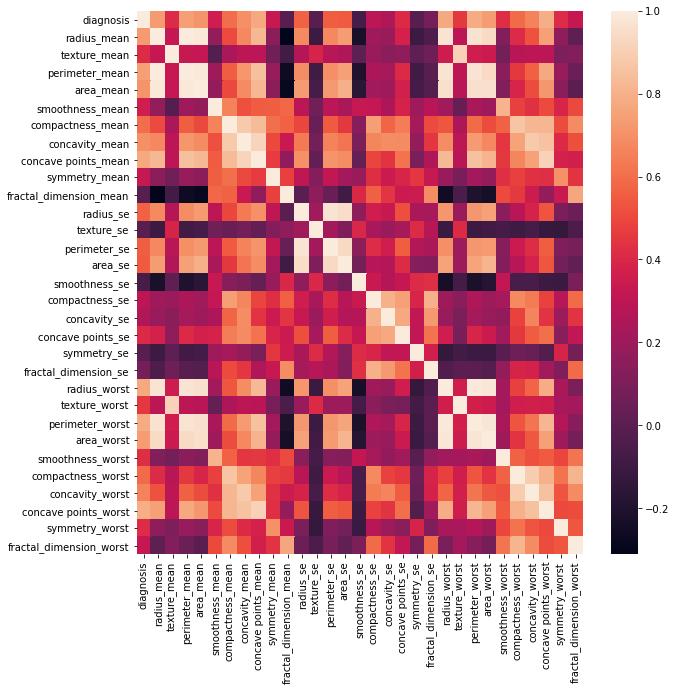

In [15]:
#Visualize correlation with heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(data.corr())

* From the heatmap, some features reprepsent possitive correlation with diagnosis.
* For case of Malignant (diagnosis=1), features like "radius_mean", "perimeter_mean", "area_mean", "concavity_mean", "radius_worst", "concave ppoints_worst", etc.

# 3. Feature engeneering selection and test selection

* Since the project is focuse on binomial classification and prediction of if the patient is likely have breast cancer or not, the logistic regression model and test would possibly be a good fit for further analysis and prediction. A binomial test could also be used as statistical test for the result. 
* The heatmap and pairplot shows some features are highly correlated with diagnosis, and some are not. We may consider chooseing specific features for futher analysis. A significant test also need to perform to confirm if it is resonable to remove some "irelevant" features.  